<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# Table of Contents
   
</div>

1. [Imports](#Imports)
2. [Load Datasets](#Load_Datasets)
<!--     1. [Sub paragraph](#subparagraph1) -->
3. [Data Exploration](#Exploration)
4. [Data Cleaning](#Cleaning)
5. [Feature Selection](#Feature_Selection)
6. [Insurance Perspective](#Insurance_Perspective)
7. [Customer Perspective](#Customer_Perspective)
8. [Comparison and Model Choice](#Comparison_Model)
9. [Prepare Test Data](#Prepare_Test)

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 1. Imports
    
<a name="Imports"></a>  
</div>

In [212]:
#!pip install pyreadstat

In [213]:
import numpy as np
import pandas as pd
import pyreadstat
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import numpy as np
import warnings
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore')

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 2. Load Datasets
    
<a name="Load_Datasets"></a>  
</div>

In [214]:
df, meta = pyreadstat.read_sas7bdat('a2z_insurance.sas7bdat')

In [215]:
df.head()

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [216]:
#Check for dupicate rows
df['CustID'] = df['CustID'].astype('int')
df['CustID'].nunique()

10296

In [217]:
df.set_index('CustID', inplace = True)

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 3. Data Exploration
    
<a name="Exploration"></a>  
</div>

In [218]:
df.isnull().sum()

FirstPolYear      30
BirthYear         17
EducDeg            0
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

In [219]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10296 entries, 1 to 10296
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   FirstPolYear   10266 non-null  float64
 1   BirthYear      10279 non-null  float64
 2   EducDeg        10296 non-null  object 
 3   MonthSal       10260 non-null  float64
 4   GeoLivArea     10295 non-null  float64
 5   Children       10275 non-null  float64
 6   CustMonVal     10296 non-null  float64
 7   ClaimsRate     10296 non-null  float64
 8   PremMotor      10262 non-null  float64
 9   PremHousehold  10296 non-null  float64
 10  PremHealth     10253 non-null  float64
 11  PremLife       10192 non-null  float64
 12  PremWork       10210 non-null  float64
dtypes: float64(12), object(1)
memory usage: 1.1+ MB


From here we can see that some variables are keep as float although thats is not the most appropiate variable type for them. We are going to correct them now so we can explore the data easier. We can also see that we have a lot of variables with missing values.

### Changing Data Types

The variables <code>BirthYear</code>, <code>FirstPolYear</code>, <code>GeoLivArea</code> and <code>Children</code> are discrete, so they should be integers. For each variable we are going to first verify there is no value that might have been mistyped and has decimal cases.

In [220]:
df[(round(df['BirthYear']) != df['BirthYear'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
420,1987.0,NaN,2 - High School,3219.0,1.0,1.0,379.30,0.33,404.52,42.80,152.25,7.78,-0.11
756,NaN,NaN,4 - PhD,2913.0,3.0,0.0,430.20,0.28,465.20,59.45,94.13,4.89,10.00
1874,1995.0,NaN,1 - Basic,517.0,1.0,1.0,-238.93,1.19,63.68,692.90,98.13,151.14,126.47
1929,1983.0,NaN,2 - High School,2426.0,4.0,1.0,163.80,0.74,286.83,158.35,181.48,72.57,30.45
2562,1976.0,NaN,2 - High School,3253.0,1.0,1.0,-44.44,1.03,298.61,13.90,191.37,49.01,33.34
2706,1978.0,NaN,3 - BSc/MSc,3614.0,4.0,0.0,356.96,0.54,381.96,274.50,117.91,35.45,12.89
3182,1987.0,NaN,2 - High School,3954.0,2.0,0.0,-25.00,1.00,233.60,206.70,265.94,36.45,21.67
3284,1983.0,NaN,3 - BSc/MSc,2433.0,1.0,1.0,289.06,0.52,321.84,83.90,238.60,3.89,3.89
3761,NaN,NaN,2 - High School,2067.0,1.0,1.0,-47.67,1.04,495.87,58.90,61.90,22.67,3.78


In [221]:
df['BirthYear'] = df['BirthYear'].astype('Int32')
df['BirthYear'].dtype

Int32Dtype()

In [222]:
#see if there are any years in which the value is a float (has decimals) - which would be an inconsistency
df[(round(df['FirstPolYear']) != df['FirstPolYear'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297,NaN,1955,4 - PhD,3591.0,NaN,NaN,-49.11,1.04,447.64,-25.00,130.58,0.89,12.89
756,NaN,<NA>,4 - PhD,2913.0,3.0,0.0,430.20,0.28,465.20,59.45,94.13,4.89,10.00
897,NaN,1960,,2643.0,1.0,1.0,-25.00,1.00,515.54,33.90,47.01,12.89,3.78
2228,NaN,1979,3 - BSc/MSc,1987.0,2.0,NaN,429.87,0.25,376.85,33.90,154.25,39.34,4.78
2450,NaN,1939,,4465.0,4.0,0.0,457.75,0.36,338.73,187.25,175.81,43.23,4.78
2704,NaN,1977,1 - Basic,2105.0,2.0,NaN,302.62,0.54,299.28,167.25,162.92,28.34,51.01
2729,NaN,1954,,3200.0,2.0,0.0,109.25,0.77,211.93,14.45,275.72,77.68,11.67
2771,NaN,1984,,1473.0,4.0,1.0,443.74,0.31,386.74,104.45,156.92,5.00,27.45
2927,NaN,1982,3 - BSc/MSc,1817.0,2.0,NaN,420.32,0.26,466.42,-10.55,112.91,12.89,16.89


In [223]:
df['FirstPolYear'] = df['FirstPolYear'].astype('Int32')
df['FirstPolYear'].dtype

Int32Dtype()

In [224]:
#see if there are any geograhic areas in which the value is a float (has decimals)
df[(round(df['GeoLivArea']) != df['GeoLivArea'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297,<NA>,1955,4 - PhD,3591.0,NaN,NaN,-49.11,1.04,447.64,-25.0,130.58,0.89,12.89


In [225]:
df['GeoLivArea'] = df['GeoLivArea'].astype('Int32')
df['GeoLivArea'].dtype

Int32Dtype()

In [226]:
#see if there are any children in which the value is a float (has decimals)
df[(round(df['Children']) != df['Children'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
297,<NA>,1955,4 - PhD,3591.0,<NA>,NaN,-49.11,1.04,447.64,-25.00,130.58,0.89,12.89
620,1980,1994,3 - BSc/MSc,1333.0,2,NaN,312.52,0.40,286.83,-6.10,175.70,52.90,56.79
773,1998,1949,2 - High School,3601.0,2,NaN,27.01,0.94,104.91,308.95,285.61,64.90,52.90
2228,<NA>,1979,3 - BSc/MSc,1987.0,2,NaN,429.87,0.25,376.85,33.90,154.25,39.34,4.78
2363,1981,1975,2 - High School,1607.0,2,NaN,271.51,0.64,292.61,308.40,159.14,11.89,59.68
2672,1992,1988,2 - High School,1140.0,2,NaN,356.40,0.54,168.03,265.60,273.94,68.79,52.23
2704,<NA>,1977,1 - Basic,2105.0,2,NaN,302.62,0.54,299.28,167.25,162.92,28.34,51.01
2927,<NA>,1982,3 - BSc/MSc,1817.0,2,NaN,420.32,0.26,466.42,-10.55,112.91,12.89,16.89
3178,1980,1975,3 - BSc/MSc,2647.0,2,NaN,392.19,0.37,404.41,107.25,110.80,24.56,12.78


In [227]:
df['Children'] = df['Children'].astype('Int32')
df['Children'].dtype

Int32Dtype()

### Continuing with data exploration

In [228]:
df.describe()

,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
count,10266.000000,10279.000000,10260.000000,10295.000000,10275.000000,10296.000000,10296.000000,10262.000000,10296.000000,10253.000000,10192.000000,10210.000000
mean,1991.062634,1968.007783,2506.667057,2.709859,0.706764,177.892605,0.742772,300.470252,210.431192,171.580833,41.855782,41.277514
std,511.267913,19.709476,1157.449634,1.266291,0.455268,1945.811505,2.916964,211.914997,352.595984,296.405976,47.480632,51.513572
min,1974.000000,1028.000000,333.000000,1.000000,0.000000,-165680.420000,0.000000,-4.110000,-75.000000,-2.110000,-7.000000,-12.000000
25%,1980.000000,1953.000000,1706.000000,1.000000,0.000000,-9.440000,0.390000,190.590000,49.450000,111.800000,9.890000,10.670000
50%,1986.000000,1968.000000,2501.500000,3.000000,1.000000,186.870000,0.720000,298.610000,132.800000,162.810000,25.560000,25.670000
75%,1992.000000,1983.000000,3290.250000,4.000000,1.000000,399.777500,0.980000,408.300000,290.050000,219.820000,57.790000,56.790000
max,53784.000000,2001.000000,55215.000000,4.000000,1.000000,11875.890000,256.200000,11604.420000,25048.800000,28272.000000,398.300000,1988.700000


The variable <code>BirthYear</code> has an impossible minimum value. The variable <code>FirstPolYear</code> also has a impossible maximum value. 

In [229]:
 df.describe(include="O").T

,count,unique,top,freq
EducDeg,10296,5,3 - BSc/MSc,4799


### Check inconsistencies

In [230]:
df.duplicated().sum()

3

In [231]:
df['BirthYear'].sort_values(ascending=True).head() 

CustID
7196    1028
7441    1935
7957    1935
330     1935
3455    1935
Name: BirthYear, dtype: Int32

We only have one value that does not make sense: 1024. Now we want to see if there are people that have their FirstPolYear before the BirthYear

In [232]:
df[df['FirstPolYear'] < (df['BirthYear'])]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
2,1981,1995,2 - High School,677.0,4,1,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
14,1983,2000,1 - Basic,1043.0,3,1,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
19,1981,1982,1 - Basic,1414.0,3,1,230.38,0.71,313.17,373.40,121.80,14.78,72.57
23,1976,1986,2 - High School,1495.0,1,1,-89.79,1.08,209.04,308.95,192.48,64.79,54.90
41,1994,1995,2 - High School,1177.0,4,1,121.36,0.84,52.01,455.65,135.47,146.36,148.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10269,1987,1988,3 - BSc/MSc,1414.0,3,1,50.46,0.90,129.58,167.80,184.48,165.92,75.46
10274,1989,1992,2 - High School,1035.0,1,1,293.51,0.58,235.71,195.60,103.13,170.92,58.12
10285,1980,1987,3 - BSc/MSc,1504.0,4,1,-1.55,0.96,390.63,29.45,179.70,-6.00,NaN


There are 1997 people that have policies that were done before they were even born.

In [233]:
df[(2016-df['BirthYear'] <18)]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
14,1983,2000,1 - Basic,1043.0,3,1,-75.12,1.06,44.34,342.85,127.69,267.94,94.46
187,1993,1999,1 - Basic,1247.0,2,1,-128.24,1.07,33.23,1026.30,82.57,75.68,212.15
398,1986,2000,1 - Basic,415.0,1,1,-218.48,1.22,52.01,348.40,49.01,193.48,225.82
481,1984,1999,1 - Basic,1581.0,4,1,866.27,0.21,30.34,683.45,98.13,71.68,249.16
527,1982,1999,1 - Basic,840.0,4,1,-23.54,1.00,132.69,165.60,137.36,129.69,164.14
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9937,1989,1999,1 - Basic,918.0,3,1,738.24,0.20,29.45,457.85,117.69,275.94,78.35
9948,1987,2000,1 - Basic,422.0,1,1,-145.58,1.07,36.23,1409.15,66.68,14.78,171.59
10044,1983,1999,1 - Basic,1110.0,1,1,907.28,0.34,25.56,1011.85,120.80,144.25,105.13


We have 116 minors. In Portugal, minors are deemed incapable of having contracts so they cannot have insurance with their name. They can however be beneficiaries on their tutors policies

In [234]:
df.groupby('EducDeg')['BirthYear'].max()

EducDeg
                   1993
1 - Basic          2001
2 - High School    1998
3 - BSc/MSc        1996
4 - PhD            1993
Name: BirthYear, dtype: Int32

All the values for the lastest year born seem normal for the education levels

### Value Counts

In [235]:
for col in df.columns:
    if df[col].dtype!="float64":
        print('-' * 40 + col + '-' * 40 , end=' - ')
        display(df[col].value_counts(dropna=False))

----------------------------------------FirstPolYear---------------------------------------- - 

1988     512
1994     475
1993     473
1989     466
1984     464
1986     458
1977     453
1978     453
1992     451
1990     449
1995     445
1981     445
1982     444
1979     443
1996     440
1987     438
1976     433
1980     432
1991     430
1985     429
1983     423
1975     285
1997     271
1974     141
1998     112
NaN       30
53784      1
Name: FirstPolYear, dtype: Int64

----------------------------------------BirthYear---------------------------------------- - 

1962    206
1968    200
1964    194
1953    193
1981    190
       ... 
2000     35
NaN      17
1935     14
2001     12
1028      1
Name: BirthYear, Length: 69, dtype: Int64

----------------------------------------EducDeg---------------------------------------- - 

3 - BSc/MSc        4799
2 - High School    3510
1 - Basic          1272
4 - PhD             698
                     17
Name: EducDeg, dtype: int64

----------------------------------------GeoLivArea---------------------------------------- - 

4      4145
1      3048
3      2066
2      1036
NaN       1
Name: GeoLivArea, dtype: Int64

----------------------------------------Children---------------------------------------- - 

1      7262
0      3013
NaN      21
Name: Children, dtype: Int64

In [236]:
df[df['EducDeg']==""]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
897,<NA>,1960,,2643.0,1,1,-25.00,1.00,515.54,33.90,47.01,12.89,3.78
1708,1992,1946,,3827.0,4,0,355.52,0.33,222.71,146.70,NaN,94.13,105.24
2450,<NA>,1939,,4465.0,4,0,457.75,0.36,338.73,187.25,175.81,43.23,4.78
2729,<NA>,1954,,3200.0,2,0,109.25,0.77,211.93,14.45,275.72,77.68,11.67
2771,<NA>,1984,,1473.0,4,1,443.74,0.31,386.74,104.45,156.92,5.00,27.45
3057,<NA>,1977,,2221.0,1,1,-9.22,0.97,475.09,15.00,93.35,15.78,2.78
4424,<NA>,1962,,2688.0,1,1,481.99,0.09,533.99,-30.00,52.01,3.00,NaN
6536,<NA>,1968,,2413.0,3,1,420.86,0.28,472.31,48.35,56.90,26.45,16.67
6561,1976,1992,,NaN,4,1,85.91,0.77,91.24,0.00,227.60,60.01,110.91


<p>The variable <code>FirstPolYear</code> has one person with the impossible value of 53784.</p>
<p>The variable <code>BirthYear</code> has one person with the impossible value of 1028.</p>
<p>The variable <code>EducDeg</code> has 17 missing values that are cells that are completly blank, but are not encoded as NaN  </p>


In [237]:
df.replace("", np.nan, inplace=True) 

### Distribuition Graphs

In [238]:
"""for col in df.columns:
    if df[col].dtype=="float64":
        fig=plt.figure()
        df.boxplot(col)"""

'for col in df.columns:\n    if df[col].dtype=="float64":\n        fig=plt.figure()\n        df.boxplot(col)'

From the previous output there are several conclusions we can take:
- <code>MonthSal</code>: has extreme values (above 30000€). These values are considered outliers, because they are very far from the rest of the distribution.
- <code>CustMonVal</code>: has a skewed distribution. There is an extreme outliers below -15000€. 
- <code>ClaimsRate</code>: also has a very skewed distribution, with an outliers above 50
- <code>PremMotor</code>: has several outliers, we can consider above 2000 as an outlier, for example
- <code>PremHousehold</code>: it is a skewed distribution with an extreme outliers 5000+
- <code>PremHealth</code>: it has two extreme outliers 5000+
- <code>PremLife</code>: has a skewed distribution but doesn't seem to have many outliers
- <code>PremWork</code>: has a skewed distribution, with one outlier, above 750.

In the outlier section we will explore these outliers in more depth and decide on how to handle them.

In [239]:
"""for col in df.columns:
    if df[col].dtype=="float64":
        fig=plt.figure()
        sns.histplot(data=df, x=col, binwidth=3)"""

'for col in df.columns:\n    if df[col].dtype=="float64":\n        fig=plt.figure()\n        sns.histplot(data=df, x=col, binwidth=3)'

Due to the outliers, it is hard to actually make something out of the distributions. We are going to zoom in some of these by filtering the outliers.

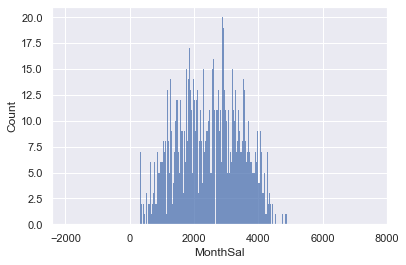

In [240]:
sns.histplot(data=df, x="MonthSal", binwidth=3)
plt.xlim(None, 8000)
plt.show()

After zooming in the histogram, we can see that the variable <code>MonthSal</code> has an almost Normal distribution

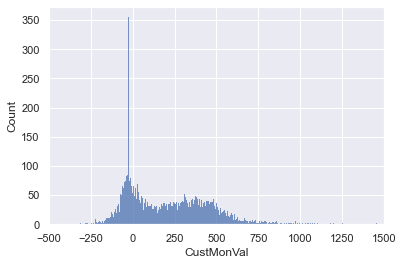

In [241]:
sns.histplot(data=df, x="CustMonVal", binwidth=3)
plt.xlim(-500, 1500)
plt.show()

We can see from the graph that there is a high number of customers with a specific value below zero

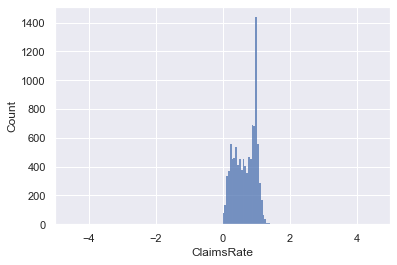

In [242]:
sns.histplot(data=df, x="ClaimsRate")
plt.xlim(-5, 5)
plt.show()

In [243]:
df['ClaimsRate'].value_counts()

1.00      457
1.01      212
1.02      203
0.99      198
1.03      195
         ... 
256.20      1
1.38        1
69.00       1
63.00       1
14.80       1
Name: ClaimsRate, Length: 165, dtype: int64

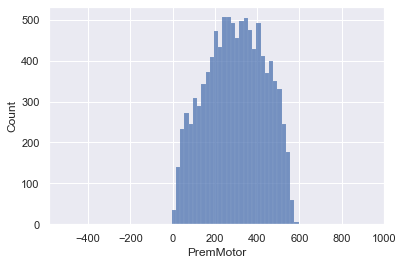

In [244]:
sns.histplot(data=df, x="PremMotor")
plt.xlim(None, 1000)
plt.show()

### Missing Value Detection

<AxesSubplot:>

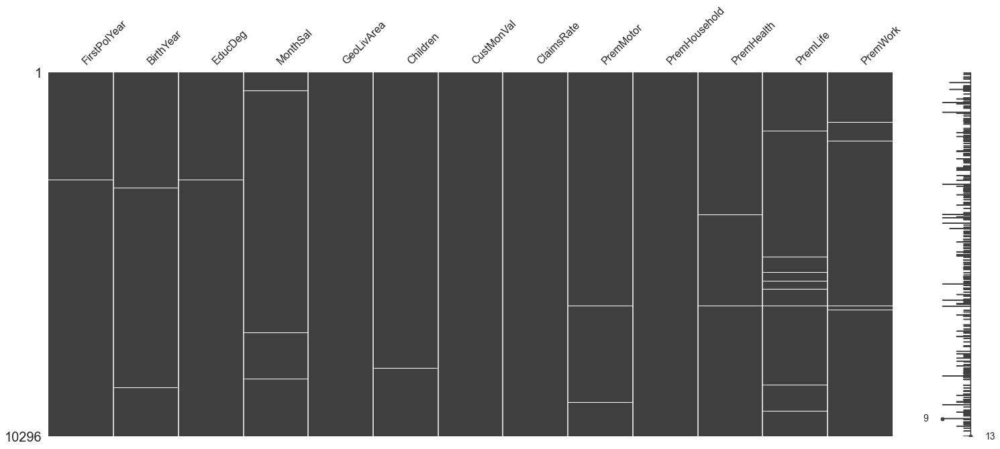

In [245]:
#verify what type of missingness we have
import missingno as msno
msno.matrix(df)
#FirstPolYear and EducDeg are MNAR (Missing Not at Random)

<p>From this it seems that <code>FirstPolYear</code> and <code>EducDeg</code> are Missing not at random.</p>
<p>We noticed that the only Premium without missings is <code>PremHousehold</code> and wondered if the missings in the other Premiums might be because there is no premium as well, so we are going to check if there are any zeros on the other Premiums.</p>

In [246]:
df[df['PremMotor']==0].shape

(0, 13)

In [247]:
df[df['PremHealth']==0].shape

(0, 13)

In [248]:
df[df['PremLife']==0].shape

(0, 13)

In [249]:
df[df['PremWork']==0].shape

(0, 13)

As there are no zeros on the other Premiums variables, we deduce that the missings in these are actually zeros due to not having a premium as in <code>PremHousehold</code>

### Variable Relationships

In [250]:

"""# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df, diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()"""

'# Pairwise Relationship of Numerical Variables\nsns.set()\n\n# Setting pairplot\nsns.pairplot(df, diag_kind="hist")\n\n# Layout\nplt.subplots_adjust(top=0.95)\nplt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)\n\nplt.show()'

From the pairplot above, it is evident that there are some variables that are highly linearly correlated. In the code below those relationships are explored in more detail.

<AxesSubplot:xlabel='ClaimsRate', ylabel='CustMonVal'>

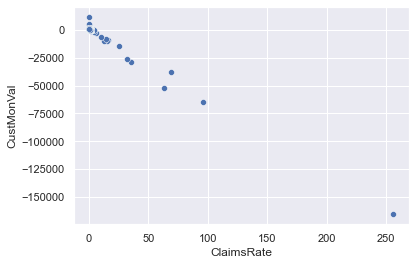

In [251]:
sns.scatterplot(data=df, x='ClaimsRate', y='CustMonVal')

According to the metadata:
- CMV Customer Monetary Value -> Lifetime value = (annual profit from customer) * (nº of years that they are a customer) - (acquisition cost)
- Claims Rate -> Amount paid by the insurance company (€)/ Premiums (€) Note: in the last 2 years



Taking the metadata into account, it makes sense that these variables are so correlated. There are some outliers with one being a very extreme one. This is a person that received much more money from the company than they paid, so they are not profitable to the company.

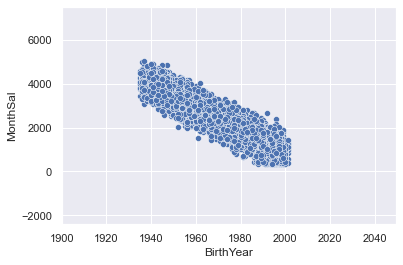

In [252]:
sns.scatterplot(data=df, x='BirthYear', y='MonthSal')
plt.xlim(1900, None)
plt.ylim(None, 7500)
plt.show()
#see in the range without outliers

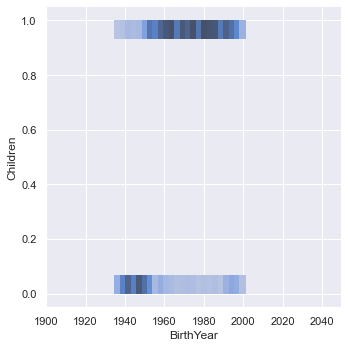

In [253]:
sns.displot(data=df, x='BirthYear', y='Children')
plt.xlim(1900, None)
plt.show()

<AxesSubplot:xlabel='PremLife', ylabel='PremMotor'>

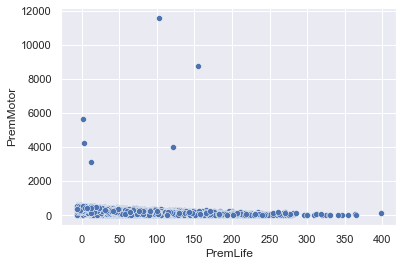

In [254]:
sns.scatterplot(data=df, x='PremLife', y='PremMotor')

In [255]:
from pandas_profiling import ProfileReport
profile = ProfileReport(
    df, 
    title='Insurance Customer Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)

In [256]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 4. Data Cleaning
    
<a name="Cleaning"></a>  
</div>

In [257]:
df_original = df.copy()

df_original.head(1)

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
1,1985,1982,2 - High School,2177.0,1,1,380.97,0.39,375.85,79.45,146.36,47.01,16.89


In [258]:
df_original.isnull().sum()

FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

### Outliers

From the previous conclusions we took:
- <code>MonthSal</code>: has extreme values (above 8000€). These values are considered outliers, because they are very far from the rest of the distribution.
- <code>CustMonVal</code>: has a skewed distribution. There is an extreme outlier below -15000€. 
- <code>ClaimsRate</code>: also has a very skewed distribution, with an outlier above 50
- <code>PremMotor</code>: has several outliers, we can consider above 6000 as an outlier, for example
- <code>PremHousehold</code>: it is a skewed distribution with an extreme outlier 5000+
- <code>PremHealth</code>: it has two extreme outliers 5000+
- <code>PremLife</code>: has a skewed distribution but doesn't seem to have many outliers
- <code>PremWork</code>: has a skewed distribution, with one outlier, above 750.
<p>We will now proceed to see how many row are affected by these outliers and will eliminate these rows if we do deem that the impact will not be huge. at the end we will calculate how much of the dataset we took.</p>

#### MonthSal

In [259]:
df[df['MonthSal']>8000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5883,1995,1956,2 - High School,55215.0,4,1,122.25,0.79,281.83,147.25,130.58,84.46,66.68
8262,1981,1991,2 - High School,34490.0,4,0,608.89,0.28,57.01,358.95,195.26,113.80,161.14


In [260]:
df.drop([5883, 8262], inplace = True)

#### CustMonVal:

In [261]:
df[df['CustMonVal']<-15000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
172,1990,1989,3 - BSc/MSc,1086.0,4,1,-165680.42,256.2,378.07,78.90,166.81,6.89,18.45
656,1974,1963,3 - BSc/MSc,3279.0,3,1,-64891.00,96.0,410.30,117.25,95.35,37.34,22.56
676,1994,1937,2 - High School,4435.0,1,0,-52382.76,63.0,197.48,280.60,276.94,51.12,38.34
708,1991,1991,3 - BSc/MSc,1634.0,1,1,-28945.40,35.0,175.70,319.50,294.39,44.12,16.89
918,1986,1952,2 - High School,3355.0,4,0,-26130.45,32.3,135.58,290.05,221.82,86.46,100.13
9649,1990,1950,3 - BSc/MSc,3574.0,3,0,-37327.08,69.0,319.06,-25.55,245.38,4.89,4.78


In [262]:
df.drop([172,656,676,708,918, 9649], inplace = True)

#### ClaimsRate

In [263]:
df[df['ClaimsRate']>50]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,


The clients with a <code>ClaimsRate</code> above 50 were already removed. 

#### PremMotor

In [264]:
df[df['PremMotor']>6000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5212,1981,1943,2 - High School,4135.0,3,0,130.14,0.99,8744.61,101.7,1767.00,155.14,130.58
5294,1989,1963,3 - BSc/MSc,3564.0,3,1,11875.89,0.09,11604.42,48.9,1045.52,103.13,296.47


In [265]:
df.drop([5212, 5294], inplace = True)

#### PremHousehold

In [266]:
df[df['PremHousehold']>5000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
6836,1975,1966,3 - BSc/MSc,2832.0,4,1,-31.00,1.00,535.10,8762.8,41.12,-6.00,9.78
8867,1978,1972,2 - High School,2618.0,4,1,473.54,0.98,508.43,25048.8,36.23,9.89,11.89


In [267]:
df.drop([6836, 8867], inplace = True)

#### PremHealth

In [268]:
df[df['PremHealth']>5000]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
7962,1995,1942,3 - BSc/MSc,4002.0,3,0,1457.99,0.83,431.86,107.80,7322.48,12.89,930.44
9150,1985,1994,2 - High School,987.0,3,1,804.05,0.97,26.34,829.05,28272.00,65.68,138.25


In [269]:
df.drop([7962, 9150], inplace = True)

#### PremWork

In [270]:
df[df['PremWork']>750]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
5085,1994,1959,2 - High School,3330.0,3,0,2314.21,0.14,350.51,201.7,125.8,39.23,1988.7


In [271]:
df.drop([5085], inplace = True)

In [272]:
print('Percentage of data kept after removing outliers:', np.round(df.shape[0] / df_original.shape[0], 4))

Percentage of data kept after removing outliers: 0.9985


We removed less than 1% of the data, which is great.

### Handling Skewed Data

Plot the histograms again after the outliers have been removed to know whether the skewness of the data was due to the outliers, or the distribution itself.

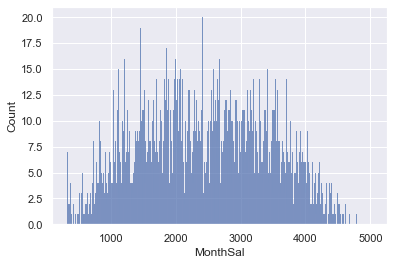

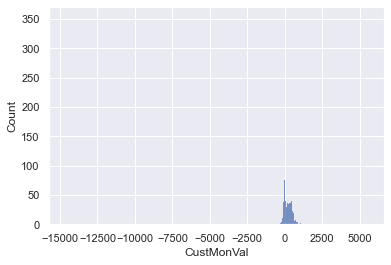

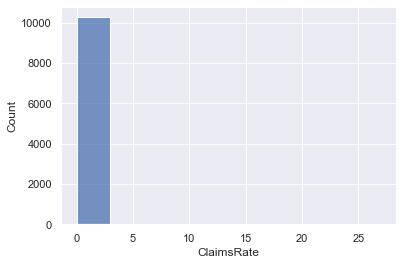

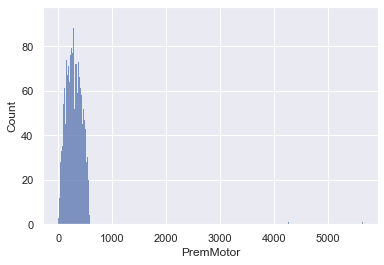

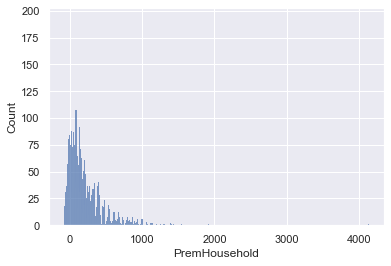

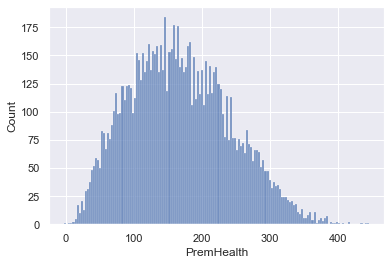

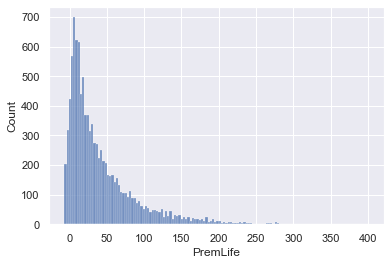

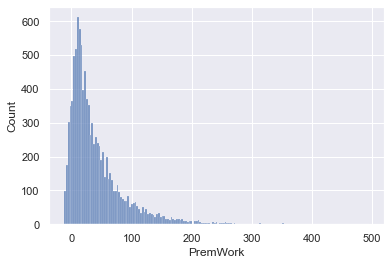

In [273]:
for col in df.columns:
    if df[col].dtype=="float64":
        fig=plt.figure()
        sns.histplot(data=df, x=col, binwidth=3)

- <code>MonthSal</code> has a distribution similar to a Normal Distribution
- Ver <code>CustMonVal</code>, variavel não skewed mas muito flat (para a esquerda mta dist, mas para a direita skewed). ver quantos valores há abaixo de -500
- <code>ClaimsRate</code> most values seem to be under 5, so we will see how many are above 5 to see if it is reasonable to drop.
- <code>PremMotor</code> here we see that the distribution seem to be somewhat similar to Normal under 1000 so we will also explore above 1000 to see if it is reasonable to drop.
- <code>PremHousehold</code>, <code>PreLife</code>,<code>PremWork</code>, are very skewed and should be transformed to be more normally dist. And <code>PremHealth</code> also seems a bit skewed.


In [274]:
len(df[df["CustMonVal"]<-500])

8

Since there are only 8 values, it is reasonable to drop them.

In [275]:
df.drop(df[df["CustMonVal"]<-500].index, inplace=True)

<AxesSubplot:xlabel='CustMonVal', ylabel='Count'>

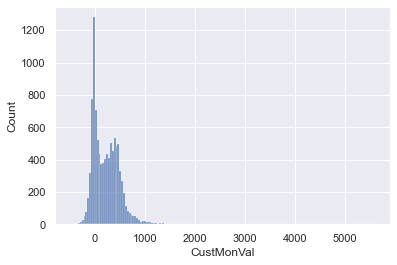

In [276]:
sns.histplot(data=df, x="CustMonVal")

As <code>CustMonVal</code> behaves a lot better without these 8 observations, they can be still considered outliers.

In [277]:
len(df[df["ClaimsRate"]>2.5])

1

In [278]:
df.drop(df[df["ClaimsRate"]>2.5].index, inplace=True)

<AxesSubplot:xlabel='ClaimsRate', ylabel='Count'>

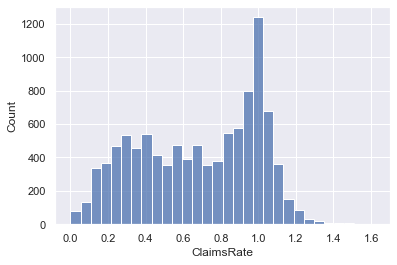

In [279]:
sns.histplot(data=df, x="ClaimsRate")

As <code>ClaimsRate</code> behaves a lot better without these 8 observations, they can be still considered outliers.

In [280]:
len(df[df["PremMotor"]>1000])

4

In [281]:
df.drop(df[df["PremMotor"]>1000].index, inplace=True)

<AxesSubplot:xlabel='PremMotor', ylabel='Count'>

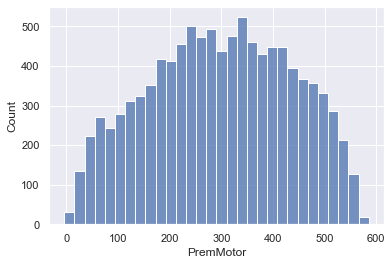

In [282]:
sns.histplot(data=df, x="PremMotor")

As <code>PremMotor</code>  also behaves a lot better without these 4  observations, they can be still considered outliers.

The other distributions have very heavy tails that are not due to outliers. To try to reduce the tail, one possible transformation is the log. We will apply this to 
<code>PremHousehold</code>, <code>PremLife</code>,<code>PremWork</code>.

<AxesSubplot:xlabel='log_PremHousehold', ylabel='Count'>

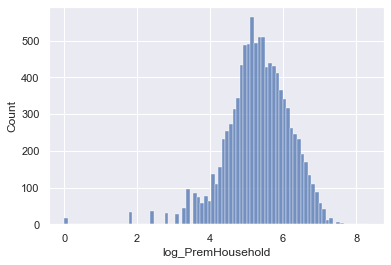

In [283]:
df["log_PremHousehold"]= np.log(df["PremHousehold"]-min(df["PremHousehold"])+1)
sns.histplot(data=df, x="log_PremHousehold")

<AxesSubplot:xlabel='log_PremLife', ylabel='Count'>

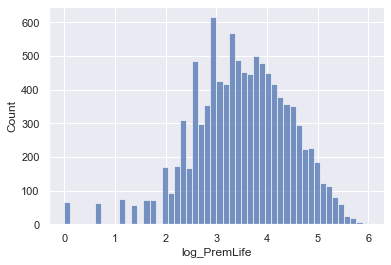

In [284]:
df["log_PremLife"]= np.log(df["PremLife"]-min(df["PremLife"])+1)
sns.histplot(data=df, x="log_PremLife")

<AxesSubplot:xlabel='log_PremWork', ylabel='Count'>

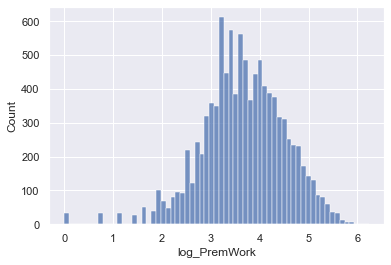

In [285]:
df["log_PremWork"]= np.log(df["PremWork"]-min(df["PremWork"])+1)
sns.histplot(data=df, x="log_PremWork")

In [286]:
print('Percentage of data kept after removing extra outliers:', np.round(df.shape[0] / df_original.shape[0], 4))

Percentage of data kept after removing extra outliers: 0.9973


### Inconsistencies

We know that there can not be people that have their fist year of the policy after 2016. And also that there can not be someone born in the 1000s.

In [287]:
df[df['FirstPolYear']>2016]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,log_PremHousehold,log_PremLife,log_PremWork
CustID,,,,,,,,,,,,,,,,
9295,53784,1948,3 - BSc/MSc,3268.0,1,0,348.85,0.37,351.4,15.0,187.37,22.45,17.78,4.51086,3.416086,3.426865


In [288]:
df.drop([9295], inplace = True)

In [289]:
df[df['BirthYear']<1900]

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,log_PremHousehold,log_PremLife,log_PremWork
CustID,,,,,,,,,,,,,,,,
7196,1993,1028,3 - BSc/MSc,2830.0,4,0,146.02,0.77,428.97,192.8,108.91,1.89,23.67,5.593968,2.291524,3.601959


In [290]:
df.drop([7196], inplace = True)

We are dropping all the minors as they cannot have contracts

In [291]:
df.drop(df[(2016-df['BirthYear'] <18)].index, inplace=True

SyntaxError: unexpected EOF while parsing (<ipython-input-291-70b8d29dac13>, line 1)

In [ ]:
print('Percentage of data kept after removing outliers and inconsistencies:', np.round(df.shape[0] / df_original.shape[0], 4))

We are still below the one percent removed. For the people that have their policy before they were born we are going to treat them by making them null and then impute these values as there are too many values to drop.

In [ ]:
df.loc[df['FirstPolYear'] < df['BirthYear'], ['FirstPolYear', 'BirthYear']] = None

### Get Dummies

As we are going to do imputation next we need to have the categorical variables dummified to be able to impute.There is only one categorical variable in this dataset. For the algorithms to be able to handle the variable, we can either transform it into various dummy variables:

In [ ]:
df_dummies = pd.get_dummies(df, columns=['EducDeg'], drop_first=True)

Or we can transform into a numerical variable, since the variable is ordinal. Taking into account that the categories themselves are already numbered, we only need to erase the characters after the number and convert the variable into int type.

In [ ]:
df['EducDeg'] = df['EducDeg'].str.split().str[0].astype('float32')
df.info()

### Missing Values

There are several methods that can be used to handle missing values. We will not drop the rows with missing values, because that constitutes a very substantial percentage of the dataset. Other methods include imputing with the median/mode or KNN imputer, which we tried both. 
<p> For the Premiuns we will fill all the missings with zeros and take these as the people not having that policy</p>

In [ ]:
df.isnull().sum()

In [ ]:
df['PremMotor'].fillna(0,inplace=True)
df['PremHealth'].fillna(0,inplace=True)
df['PremLife'].fillna(0,inplace=True)
df['PremWork'].fillna(0,inplace=True)
df['log_PremLife'].fillna(0-min(df["PremLife"])+1,inplace=True)
df['log_PremWork'].fillna(0-min(df["PremWork"])+1,inplace=True)

In [ ]:
df.isnull().sum()

For the rest of the variables we will use the IterativeImputer as it is more robust than the KNN Imputer and we have a large number of missing values.

In [ ]:
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import KNNImputer
# Create an instance of the IterativeImputer
imputer = KNNImputer(n_neighbors=5, weights='uniform')
# Use the fit_transform method to impute the missing values
df_imputed = imputer.fit_transform(df)
# Convert the imputed array back into a DataFrame
df_imputed = pd.DataFrame(df_imputed, index=df.index, columns=df.columns)
# Select the columns to round
columns = ['FirstPolYear', 'BirthYear']

# Round the columns to the nearest integer
df_imputed[columns] = df_imputed[columns].round(0).astype(int)

In [ ]:
'''
#df.fillna(0,inplace=True)
from sklearn.impute import SimpleImputer
imp_mean = SimpleImputer(missing_values=np.nan, strategy='median')
df = pd.DataFrame(imp_mean.fit_transform(df.loc[:, df.columns != 'EducDeg']),index=df.index, columns = df.columns[df.columns != 'EducDeg'])
#df['EducDeg'].fillna(df['EducDeg'].mode(),inplace=True)
'''

In [ ]:
x_column = 'FirstPolYear'
y_column = 'BirthYear'

# Create the segmented bar plot
ax = sns.barplot(x=x_column, y=y_column, data=df[df.notnull().all(axis=1)])

# Set the title and labels
ax.set_title(f'Segmented bar plot of {y_column} by {x_column}')
ax.set_xlabel(x_column)
ax.set_ylabel(y_column)
# Adjust the width and font size of the labels
ax.figure.set_size_inches(10, 5)
ax.tick_params(axis='x', labelsize=8)
# Change the range of the y-axis
ax.set_ylim(1950, 2000)

# Show the plot
plt.show()

In [ ]:
x_column = 'FirstPolYear'
y_column = 'BirthYear'

# Create the segmented bar plot
ax = sns.barplot(x=x_column, y=y_column, data=df_imputed)

# Set the title and labels
ax.set_title(f'Segmented bar plot of {y_column} by {x_column} and Sport')
ax.set_xlabel(x_column)
ax.set_ylabel(y_column)
# Adjust the width and font size of the labels
ax.figure.set_size_inches(10, 5)
ax.tick_params(axis='x', labelsize=8)
# Change the range of the y-axis

ax.set_ylim(1950, 2000)

# Show the plot
plt.show()

In [ ]:
df=df_imputed

In [ ]:
df.info()

### New Features

In [ ]:
 df['TotalPrem'] = df['PremMotor'] + df['PremHousehold'] + df['PremLife'] + df['PremWork'] + df['PremHealth']

In [ ]:
df['Age'] = (2016 - df['BirthYear'])

In [ ]:
df = df.drop('BirthYear', axis = 1)
df.head(1)

### Separating Numerical Variables from Categorical/Binary

In [ ]:
df_cat = df[['EducDeg', 'GeoLivArea', 'Children']]
df_num = df.drop(df_cat.columns, axis=1)

In [ ]:
df_num.info()

### Scaling of Data

#### Minmax

In [ ]:
scaler = MinMaxScaler()
df_minmax = scaler.fit_transform(df[df.columns])
#df=df_minmax.copy()

In [ ]:
#df.head()

In [ ]:
"""scaler = MinMaxScaler().fit(df[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']])
# this will return an array
df[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']] = scaler.transform(df[['BirthYear','FirstPolYear','MonthSal','CustMonVal','ClaimsRate','PremHousehold','PremHealth','PremLife','PremWork','PremMotor']])
df.head()"""

#### Robust Scaler

In [ ]:
scaler = RobustScaler()
df_robust = scaler.fit_transform(df[df.columns])
df[df.columns]=df_robust.copy()

### Check results

In [ ]:
profile = ProfileReport(
    df, 
    title='Insurance Customer Data',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)
profile.to_notebook_iframe()

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 5. Feature Selection
    
<a name="Feature_Selection"></a>  
</div>

### PCA 

In [ ]:
df_pca = df_num.copy()

In [ ]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca)
pca_feat  # What is this output?

In [ ]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

In [ ]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [ ]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=2)
pca_feat = pca.fit_transform(df_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  # remember index=df_pca.index
pca_df

In [ ]:
# Reassigning df to contain pca variables
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca.head()

In [ ]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: red'
    elif val > 0.45:
        color = 'background-color: green'
    else:
        color = ''
    return color

# Interpreting each Principal Component
loadings = df_pca.corr().loc[df_pca.columns[:-3], pca_feat_names]
loadings.style.applymap(_color_red_or_green)

In [ ]:
df.head()

### Correlation Matrix

In [ ]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df_num.corr(method="pearson"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)


plt.show()

As we have seen before, <code>CustMonVal</code> has a very high negative correlation with ClaimsRate, so we are not using the variable <code>ClaimsRate</code> for our perpectives, as we think that <code>CustMonVal</code> has an easier interpretation.
We can also see that <code>Age</code> has a very high positive correlation with the variable <code>MonthSal</code>. As the variable <code>Age</code> seems to have higher correlations, we are not using it for our perspectives.


### Define perpectives for our data

In [ ]:
df_insurance = df[["FirstPolYear", "CustMonVal", "PremMotor", "log_PremHousehold", "PremHealth", "log_PremLife"]] #, "log_PremWork"

In [ ]:
df_customers = df[["MonthSal", "GeoLivArea", "Children", "EducDeg"]]

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 6. Insurance Perspective
    
<a name="Insurance_Perspective"></a>  
</div>

## 6.1 Hierarchical Clustering

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

### Defining the linkage method to choose

In [ ]:
def get_r2_hc(dataset, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(dataset):
        ss = np.sum(dataset.var() * (dataset.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        
        
        hclabels = cluster.fit_predict(dataset) #get cluster labels
        
        
        df_concat = pd.concat((dataset, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        
        
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        
        
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        
        
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [ ]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 5
r2_hc_methods = np.vstack(
    [
        get_r2_hc(df_insurance, link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

### Number of Clusters

In [ ]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'complete'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df_insurance)

In [ ]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 9
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

### Final solution

In [ ]:
linkage = 'complete'
distance = 'euclidean'
hcinsur = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=2)
hcinsur_labels = hcinsur.fit_predict(df_insurance)

In [ ]:
df_concat = pd.concat((df, pd.Series(hcinsur_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

In [ ]:
score = silhouette_score(df_insurance, hcinsur_labels)
print(score)

## 6.2 K-Means Clustering

In [ ]:
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import KMeans
import matplotlib.cm as cm

In [ ]:
#Define nº of clusters
inertia = []
for n_clus in range(1,11):  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(df_insurance)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

In [ ]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [ ]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,11):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(df_insurance)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_insurance, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_insurance, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_insurance) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

In [ ]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [ ]:
# final cluster solution
number_clusters = 2
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(df_insurance)
km_labels

In [ ]:
# Characterizing the final clusters
df_concat = pd.concat((df_insurance, pd.Series(km_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

### Final K-Means

In [ ]:
#init= "k-means++"
kmclust = KMeans(n_clusters=2, init='k-means++', n_init=15, random_state=1)
# the fit method
kmclust.fit(df_insurance)

In [ ]:
# the predict method
kmclust.predict(df_insurance)

In [ ]:
# the transform method
pd.DataFrame(kmclust.transform(df_insurance))

## 6.3 Self-Organizing Map (SOM)

In [ ]:
from IPython.display import YouTubeVideo

from os.path import join
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier

import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

In [ ]:
from matplotlib.patches import RegularPolygon, Ellipse
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import cm, colorbar
from matplotlib import colors as mpl_colors

from matplotlib.lines import Line2D
from matplotlib import __version__ as mplver

In [ ]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

sm = sompy.SOMFactory().build(
    df_insurance.values, 
    mapsize=[30, 30],  # NEEDS TO BE A LIST
    mapshape= 'planar', #planar, 2Dimensions
    initialization='pca', #pca, random
    neighborhood='gaussian', #gaussian, bubble
    training='batch', #batch, seq
    lattice='hexa', #rect, hexa
    component_names=df_insurance.columns
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

In [ ]:
###################################
### Visualizing Component Planes ##
###################################

def plot_component_planes(weights,
                          features,
                          M=3, N=4, 
                          figsize=(20,20),
                          figlayout=(3,4),
                          title="Component Planes",
                          cmap=cm.magma
                         ):
    
    xx, yy = np.meshgrid(np.arange(M), np.arange(N))
    xx = xx.astype(float)
    yy = yy.astype(float)

    xx[::-2] -= 0.5

    xx = xx.T
    yy = yy.T
    
    weights_ = weights.reshape((M,N,len(features)))

    fig = plt.figure(figsize=figsize, constrained_layout=True)
    subfigs = fig.subfigures(figlayout[0], figlayout[1], wspace=.15)
    
    ## Normalize color scale to range of all values
    colornorm = mpl_colors.Normalize(vmin=np.min(weights), 
                                         vmax=np.max(weights))

    for cpi, sf in zip(range(len(df_insurance.columns)), subfigs.flatten()):

        sf.suptitle(features[cpi], y=0.95)

        axs = sf.subplots(1,1, )
        axs.set_aspect('equal')

        ## Normalize color scale to range of values in each component
        colornorm = mpl_colors.Normalize(vmin=np.min(weights_[:,:,cpi]), 
                                         vmax=np.max(weights_[:,:,cpi]))

        # iteratively add hexagons
        for i in range(weights_.shape[0]):
            for j in range(weights_.shape[1]):
                wy = yy[(i, j)] * np.sqrt(3) / 2
                hexagon = RegularPolygon((xx[(i, j)], wy), 
                                     numVertices=6, 
                                     radius=.99 / np.sqrt(3),
                                     facecolor=cmap(colornorm(weights_[i, j, cpi])), 
                                     alpha=1, 
                                     linewidth=.5,
                                     edgecolor=cmap(colornorm(weights_[i, j, cpi]))
                                    )
                axs.add_patch(hexagon)


        ## only run this block if matplotlib >= 3.6.x
        mplv = [int(i) for i in mplver.split('.')]
        if mplv[1] >= 6:
            ## Add colorbar
            divider = make_axes_locatable(axs)

            ax_cb = divider.append_axes("right", size="7%")#, pad="2%")

            ## Create a Mappable object
            cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
            cmap_sm.set_array([])

            ## Create custom colorbar 
            cb1 = colorbar.Colorbar(ax_cb,
                                    orientation='vertical', 
                                    alpha=1,
                                    mappable=cmap_sm
                                    )
            cb1.ax.get_yaxis().labelpad = 16

            ## Add colorbar to plot
            sf.add_axes(ax_cb)



        ## Remove axes for hex plot
        axs.margins(.05)
        axs.axis("off")


    fig.suptitle(title)
    plt.show()

In [ ]:
plot_component_planes(weights=sm.codebook.matrix,features=df_insurance.columns,
                      M=30,N=30,
                      figsize=(12,15),figlayout=(4,3),
                      title="Component Planes",
                      cmap=sns.color_palette("rocket", as_cmap=True))

#### U-Matrix

In [ ]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2,
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

#np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

#### Hit-map

In [ ]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

### Clustering with SOMs: K-means SOM vs Emergent SOM
- In **k-means SOM**, the *number of units should be equal to the expected number of clusters*, and thus each cluster should be represented by a single unit. 
- In **emergent SOM**, a very *large number of units is used*. These very large SOM allow for very clear U-Matrices and are useful for detecting quite clearly the underlying structure of the data. This technique can be **used together with other clustering algorithms**.

## K-means SOM

In [ ]:
# Do the Inertia plot here (check last class' notebook)

In [ ]:
range_clusters = range(1, 21)

inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(sm.codebook.matrix)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

In [ ]:
# The inertia plot
plt.figure(figsize=(12,7))
plt.plot(range_clusters, inertia)
plt.xticks(range_clusters)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)

plt.show()

In [ ]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_weights() output)

## Flatten weights matrix to (MxN)x(features) 
K = 4
kmeans = KMeans(n_clusters=K, init='k-means++', n_init=15, random_state=1)
cluster_labels = kmeans.fit_predict(sm.codebook.matrix)

# Each neuron's cluster label
cluster_labels


In [ ]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

## Hierarchical Clustering with SOM

In [ ]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        get_r2_hc(dataset=pd.DataFrame(sm.codebook.matrix), link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [ ]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(pd.DataFrame(sm.codebook.matrix))

##########################
## Plot Dendrogram
##########################

# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 40
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [ ]:
# Perform Hierarchical clustering on top of the 2500 untis (sm.get_node_vectors() output)
hierclust = AgglomerativeClustering(n_clusters=2, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

## Mean Shift Clustering

In [ ]:
 from os.path import join
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

In [ ]:
# Choose a range of quantile values to test
quantile_values = [0.2, 0.3, 0.4, 0.5, 0.6]

# Store the silhouette scores for each quantile value
silhouette_scores = []

for quantile in quantile_values:
    # Perform mean shift clustering with the current quantile value
    bandwidth = estimate_bandwidth(df_insurance, quantile=quantile, random_state=1, n_jobs=1)
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
    clusters = ms.fit_predict(df_insurance)
    
    # Compute the silhouette score for the current clusters
    score = silhouette_score(df_insurance, clusters)
    silhouette_scores.append(score)
    
# Plot the silhouette scores for each quantile value
plt.plot(quantile_values, silhouette_scores)
plt.xlabel("Quantile Value")
plt.ylabel("Silhouette Score")
plt.show()


In [ ]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(df_insurance, quantile=0.3, random_state=1, n_jobs=-1)
bandwidth

In [ ]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(df_insurance)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df, pd.Series(ms_labels, index=df_insurance.index, name="ms_labels")], axis=1)
df_concat.head()

In [ ]:
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

In [ ]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_insurance)  # get total sum of squares
ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

## DBSCAN

### Defining eps and min_samples:
- **MinPts**: As a rule of thumb, **minPts = 2 x dim** can be used, but it may be necessary to choose larger values for very large data, for noisy data or for data that contains many duplicates.

- **ε**: The value for ε can then be chosen by using a **k-distance graph**, plotting the distance to the kth (k = minPts - 1) nearest neighbor ordered from the largest to the smallest value. Good values of ε are where this plot shows an **"elbow"**: if ε is chosen much too small, a large part of the data will not be clustered; whereas for a too high value of ε, clusters will merge and the majority of objects will be in the same cluster. **The assumption is that for points in a cluster, their k nearest neighbors are at roughly the same distance**. Noise points have their k-th nearest neighbors at farther distance

In [ ]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.4, min_samples=25, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_insurance)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

In [ ]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=25)
neigh.fit(df_insurance)
distances, _ = neigh.kneighbors(df_insurance)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df_insurance, pd.Series(dbscan_labels, index=df_insurance.index, name="dbscan_labels")], axis=1)
df_concat.head()

In [ ]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

In [ ]:
df_concat.groupby('dbscan_labels').mean()

In [ ]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
sst = get_ss(df_insurance)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

## GMM

Assumes data is Normally distributed. Might not fit our data well, because our variables are not Normally distributed.

In [ ]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_insurance)
labels_proba = gmm.predict_proba(df_insurance)

In [ ]:
# The estimated component weights
gmm.weights_

In [ ]:
# The estimated mean vectors of the Components
gmm.means_

In [ ]:
# The estimated covariance matrices of the Components
gmm.covariances_.shape

In [ ]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_insurance)
          for n in n_components]

bic_values = [m.bic(df_insurance) for m in models]
aic_values = [m.aic(df_insurance) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [ ]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=3, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_insurance)

In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df_insurance, pd.Series(gmm_labels, index=df_insurance.index, name="gmm_labels")], axis=1)
df_concat.head()

In [ ]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_insurance)  # get total sum of squares
ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

## Final Cluster Solution

In case of SOM:

In [ ]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=df_insurance.columns)
df_nodes['label'] = nodeclus_labels
df_nodes

In [ ]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(df_insurance)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((df, np.expand_dims(bmus_map,1)), axis=1),
    index=df.index, columns=np.append(df.columns,"BMU")
)
df_bmus

In [ ]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final

In [ ]:
# Characterizing the final clusters
df_final.drop(columns='BMU').groupby('label').mean()

In [ ]:
sst = get_ss(df_final[metric_features])  # get total sum of squares
ssw_labels = df_final[metric_features.to_list() + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

<div class="alert alert-block alert-info" style = "background:#d0de6f; color:#000000; border:0;">
    
# 7. Customer Perspective
    
<a name="Customer_Perspective"></a>  
</div>

### Defining the linkage method to choose

In [ ]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 5
r2_hc_methods = np.vstack(
    [
        get_r2_hc(df_customers, link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

### Number of Clusters

In [ ]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'single'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(df_customers)

In [ ]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 0.9
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

### Final solution

In [ ]:
linkage = 'single'
distance = 'euclidean'
hccust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=2)
hccust_labels = hccust.fit_predict(df_customers)

In [ ]:
df_concat = pd.concat((df, pd.Series(hccust_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

In [ ]:
score = silhouette_score(df_customers, hccust_labels)
print(score)

## 6.2 K-Means Clustering

In [ ]:
#Define nº of clusters
inertia = []
for n_clus in range(1,11):  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=30, random_state=1)
    kmclust.fit(df_customers)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

In [ ]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

In [ ]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

# Storing average silhouette metric
avg_silhouette = []
for nclus in range(1,11):
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=30, random_state=1)
    cluster_labels = kmclust.fit_predict(df_customers)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(df_customers, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_customers, cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(df_customers) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

In [ ]:
# The average silhouette plot
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(avg_silhouette)
plt.ylabel("Average silhouette")
plt.xlabel("Number of clusters")
plt.title("Average silhouette plot over clusters", size=15)
plt.show()

In [ ]:
# final cluster solution
number_clusters = 3
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(df_customers)
km_labels

In [ ]:
# Characterizing the final clusters
df_concat = pd.concat((df_customers, pd.Series(km_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

### Final K-Means

In [ ]:
#init= "k-means++"
kmclust = KMeans(n_clusters=3, init='k-means++', n_init=30, random_state=1)
# the fit method
kmclust.fit(df_customers)

In [ ]:
# the predict method
kmclust.predict(df_customers)

In [ ]:
# the transform method
pd.DataFrame(kmclust.transform(df_customers))

## 6.3 Self-Organizing Map (SOM)

In [ ]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

sm = sompy.SOMFactory().build(
    df_customers.values, 
    mapsize=[30, 30],  # NEEDS TO BE A LIST
    mapshape= '2Dimensions', #planar, 2Dimensions
    initialization='pca', #pca, random
    neighborhood='gaussian', #gaussian, bubble
    training='batch', #batch, seq
    lattice='hexa', #rect, hexa
    component_names=df_insurance.columns
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

In [ ]:
###################################
### Visualizing Component Planes ##
###################################

def plot_component_planes(weights,
                          features,
                          M=3, N=4, 
                          figsize=(20,20),
                          figlayout=(3,4),
                          title="Component Planes",
                          cmap=cm.magma
                         ):
    
    xx, yy = np.meshgrid(np.arange(M), np.arange(N))
    xx = xx.astype(float)
    yy = yy.astype(float)

    xx[::-2] -= 0.5

    xx = xx.T
    yy = yy.T
    
    weights_ = weights.reshape((M,N,len(features)))

    fig = plt.figure(figsize=figsize, constrained_layout=True)
    subfigs = fig.subfigures(figlayout[0], figlayout[1], wspace=.15)
    
    ## Normalize color scale to range of all values
    colornorm = mpl_colors.Normalize(vmin=np.min(weights), 
                                         vmax=np.max(weights))

    for cpi, sf in zip(range(len(df_customers.columns)), subfigs.flatten()):

        sf.suptitle(features[cpi], y=0.95)

        axs = sf.subplots(1,1, )
        axs.set_aspect('equal')

        ## Normalize color scale to range of values in each component
        colornorm = mpl_colors.Normalize(vmin=np.min(weights_[:,:,cpi]), 
                                         vmax=np.max(weights_[:,:,cpi]))

        # iteratively add hexagons
        for i in range(weights_.shape[0]):
            for j in range(weights_.shape[1]):
                wy = yy[(i, j)] * np.sqrt(3) / 2
                hexagon = RegularPolygon((xx[(i, j)], wy), 
                                     numVertices=6, 
                                     radius=.99 / np.sqrt(3),
                                     facecolor=cmap(colornorm(weights_[i, j, cpi])), 
                                     alpha=1, 
                                     linewidth=.5,
                                     edgecolor=cmap(colornorm(weights_[i, j, cpi]))
                                    )
                axs.add_patch(hexagon)


        ## only run this block if matplotlib >= 3.6.x
        mplv = [int(i) for i in mplver.split('.')]
        if mplv[1] >= 6:
            ## Add colorbar
            divider = make_axes_locatable(axs)

            ax_cb = divider.append_axes("right", size="7%")#, pad="2%")

            ## Create a Mappable object
            cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
            cmap_sm.set_array([])

            ## Create custom colorbar 
            cb1 = colorbar.Colorbar(ax_cb,
                                    orientation='vertical', 
                                    alpha=1,
                                    mappable=cmap_sm
                                    )
            cb1.ax.get_yaxis().labelpad = 16

            ## Add colorbar to plot
            sf.add_axes(ax_cb)



        ## Remove axes for hex plot
        axs.margins(.05)
        axs.axis("off")


    fig.suptitle(title)
    plt.show()

In [ ]:
plot_component_planes(weights=sm.codebook.matrix,features=df_customers.columns,
                      M=30,N=30,
                      figsize=(12,15),figlayout=(4,3),
                      title="Component Planes",
                      cmap=sns.color_palette("rocket", as_cmap=True))

#### U-Matrix

In [ ]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2,
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

#np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

#### Hit-map

In [ ]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

### Clustering with SOMs: K-means SOM vs Emergent SOM
- In **k-means SOM**, the *number of units should be equal to the expected number of clusters*, and thus each cluster should be represented by a single unit. 
- In **emergent SOM**, a very *large number of units is used*. These very large SOM allow for very clear U-Matrices and are useful for detecting quite clearly the underlying structure of the data. This technique can be **used together with other clustering algorithms**.

## K-means SOM

In [ ]:
# Do the Inertia plot here (check last class' notebook)

In [ ]:
range_clusters = range(1, 21)

inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(sm.codebook.matrix)
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

In [ ]:
# The inertia plot
plt.figure(figsize=(12,7))
plt.plot(range_clusters, inertia)
plt.xticks(range_clusters)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)

plt.show()

In [ ]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_weights() output)

## Flatten weights matrix to (MxN)x(features) 
K = 4
kmeans = KMeans(n_clusters=K, init='k-means++', n_init=20, random_state=42)
cluster_labels = kmeans.fit_predict(sm.codebook.matrix)

# Each neuron's cluster label
cluster_labels


In [ ]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

## Hierarchical Clustering with SOM

In [ ]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack(
    [
        get_r2_hc(dataset=pd.DataFrame(sm.codebook.matrix), link_method=link, max_nclus=max_nclus) 
        for link in hc_methods
    ]
).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [ ]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(pd.DataFrame(sm.codebook.matrix))

##########################
## Plot Dendrogram
##########################

# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 40
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [ ]:
# Perform Hierarchical clustering on top of the 2500 untis (sm.get_node_vectors() output)
hierclust = AgglomerativeClustering(n_clusters=2, linkage='ward')
nodeclus_labels = hierclust.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

## Mean Shift Clustering

In [ ]:
# Choose a range of quantile values to test
quantile_values = [0.4, 0.5, 0.6 ,0.65]

# Store the silhouette scores for each quantile value
silhouette_scores = []

for quantile in quantile_values:
    # Perform mean shift clustering with the current quantile value
    bandwidth = estimate_bandwidth(df_customers, quantile=quantile, random_state=1, n_jobs=1)
    ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
    clusters = ms.fit_predict(df_insurance)
    
    # Compute the silhouette score for the current clusters
    score = silhouette_score(df_insurance, clusters)
    silhouette_scores.append(score)
    
# Plot the silhouette scores for each quantile value
plt.plot(quantile_values, silhouette_scores)
plt.xlabel("Quantile Value")
plt.ylabel("Silhouette Score")
plt.show()

In [ ]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(df_customers, quantile=0.16, random_state=1, n_jobs=-1)
bandwidth

In [ ]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(df_customers)

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df_customers, pd.Series(ms_labels, index=df_customers.index, name="ms_labels")], axis=1)
df_concat.head()

In [ ]:
df_concat.groupby('ms_labels').mean()

In [ ]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_customers)  # get total sum of squares
ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

## DBSCAN

In [ ]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=0.37, min_samples=16, n_jobs=-1)
dbscan_labels = dbscan.fit_predict(df_customers)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)
dbscan_labels = dbscan.fit_predict(df_customers)

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

In [ ]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=16)
neigh.fit(df_customers)
distances, _ = neigh.kneighbors(df_customers)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df_customers, pd.Series(dbscan_labels, index=df_customers.index, name="dbscan_labels")], axis=1)
df_concat.head()

In [ ]:
# Detecting noise (potential outliers)
df_concat.loc[df_concat['dbscan_labels'] == -1]

In [ ]:
df_concat.groupby('dbscan_labels').mean()

In [ ]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concat.loc[df_concat['dbscan_labels'] != -1]
sst = get_ss(df_customers)  # get total sum of squares
ssw_labels = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

## GMM

Assumes data is Normally distributed. Might not fit our data well, because our variables are not Normally distributed.

In [ ]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_customers)
labels_proba = gmm.predict_proba(df_customers)

In [ ]:
# The estimated component weights
gmm.weights_

In [ ]:
# The estimated mean vectors of the Components
gmm.means_

In [ ]:
# The estimated covariance matrices of the Components
gmm.covariances_.shape

In [ ]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(df_customers)
          for n in n_components]

bic_values = [m.bic(df_customers) for m in models]
aic_values = [m.aic(df_customers) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [ ]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(df_customers)

In [ ]:
# Concatenating the labels to df
df_concat = pd.concat([df_customers, pd.Series(gmm_labels, index=df_customers.index, name="gmm_labels")], axis=1)
df_concat.head()

In [ ]:
# Computing the R^2 of the cluster solution
sst = get_ss(df_customers)  # get total sum of squares
ssw_labels = df_concat.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

## Final Cluster Solution

In case of SOM:

In [ ]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=df_customers.columns)
df_nodes['label'] = nodeclus_labels
df_nodes

In [ ]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(df_customers)[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((df, np.expand_dims(bmus_map,1)), axis=1),
    index=df.index, columns=np.append(df.columns,"BMU")
)
df_bmus

In [ ]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final

In [ ]:
# Characterizing the final clusters
df_final.drop(columns='BMU').groupby('label').mean()

In [ ]:
sst = get_ss(df_final[metric_features])  # get total sum of squares
ssw_labels = df_final[metric_features.to_list() + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2